,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,display_name,class,type,importance,geometry
0,51.523312,51.50687,-0.072747,-0.11383,307505977,relation,51800,51.515618,-0.091998,"City of London, Greater London, England, Unite...",boundary,administrative,0.996511,"POLYGON ((-0.11383 51.51826, -0.1138 51.51812,..."


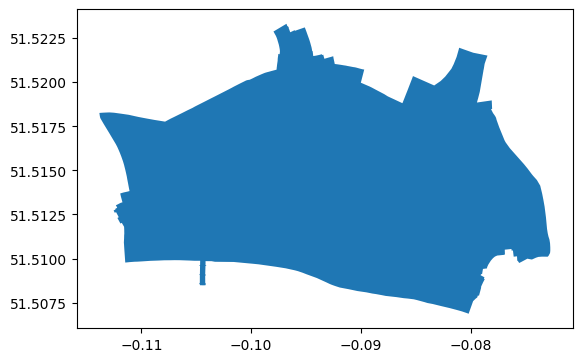

In [1]:
import os
import osmnx as ox
import geopandas as gpd

boundary = gpd.read_file('London_UK/boundary/boundary.geojson')
boundary.plot()
boundary.head()

In [2]:
# get the street network for Delft based on the boundary of the municipality
network_type = 'all' # You can also choose 'walk', 'bike' or 'drive'
G = ox.graph_from_polygon(boundary.geometry[0], network_type = network_type) 

# Convert the graph into a GeoDataFrame
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
gdf_edges = gdf_edges.apply(lambda series: series.apply(lambda x: str(x) if isinstance(x, list) else x))

# Create a folder to store the data if it does not exist
if not os.path.exists('data/Delft_NL/network_data'):
    os.makedirs('data/Delft_NL/network_data')

# Save the data
gdf_nodes.to_file(f'data/Delft_NL/network_data/nodes_{network_type}.geojson', driver='GeoJSON')
gdf_edges.to_file(f'data/Delft_NL/network_data/edges_{network_type}.geojson', driver='GeoJSON')

# Save the graph of networkX
ox.save_graphml(G, filepath=f'data/Delft_NL/network_data/graph_{network_type}.graphml')


In [3]:
gdf_edges.reset_index().sample(5)

,u,v,key,osmid,highway,lanes,maxspeed,name,ref,oneway,...,length,geometry,tunnel,bridge,access,width,junction,service,est_width,area
366,21563788,11903396761,0,122040115,unclassified,NaN,20 mph,Stonecutter Street,NaN,False,...,44.251113,"LINESTRING (-0.10543 51.51575, -0.10601 51.515...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7000,5067002851,10979127316,0,519695965,footway,NaN,NaN,NaN,NaN,False,...,46.429817,"LINESTRING (-0.0949 51.51736, -0.09498 51.5172...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2090,585130362,9135845216,0,4253999,residential,NaN,20 mph,America Square,NaN,False,...,29.101205,"LINESTRING (-0.07579 51.51134, -0.07586 51.511...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
454,24661419,24950111,0,4231096,pedestrian,NaN,20 mph,Birchin Lane,NaN,True,...,50.753370,"LINESTRING (-0.08639 51.51285, -0.08651 51.512...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9907,10539068565,2665239978,0,"[693398050, 693398051, 1130873804]",unclassified,1,NaN,Blackfriars Passage,NaN,True,...,83.374300,"LINESTRING (-0.1032 51.51111, -0.10289 51.5111...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
gdf_edges.explore()